# Proyecto para generar gráficas de los resultados de la experimentación con Colas Concurrentes

## Instalación de dependencias

En este proyecto, primero se instalarán dependencias para la generación de gráficas y su evaluación. Esto lo haremos con el siguiente comando:

In [1]:
%%capture --no-display
!pip install pandas matplotlib scipy TexSoup;
!pip install --upgrade jupyterlab ipympl

## Funciones para el procesamiento y generación de gráficas

### Estructuras de datos a evaluar

La evaluación experimental de colas concurrentes se enfoca en dos tipos de experimentos:

1. Experimentos internos: Estos experimentos son para evaluar los objetos **LL/IC**, y posteriormente en combinación con los baskets diseñados se evaluó el rendimiento de las distintas combinaciones para la cola modular. Para la evaluación experimental se realizaron $5 * 10^6$ operaciones, donde para los objetos **LL/IC** se realizaron en llamadas intercaladas de `LL` seguida de `IC` con algo de trabajo aleatorio para evitar escenarios de larga ejecución artificiales. Para el caso de la evaluación de las colas, se realizó un experimento similar. Se realizaron $5 * 10^6$ llamadas intercaladas de `enqueue`/`dequeue` con su respectivo trabajo artificial. Esta experimentación se hizo utilizando desde uno hasta el total de cores soportado por el procesador. Cada experimentación se siguió una metodología estadística rigurosa que será descrita más abajo.

2. Experimentos externos: Tomando la mejor combinación de **LL/IC** con su respectivo basket en la evaluación de colas, se evalua esta cola contra las siguientes colas:
    1. Michael-Scott's lock-free queue
    2. Ramalhete's lock-free queue
    3. LCRQ lock-free queue
    4. Ostrovsky-Morrison's lock-free queue
    5. Yang & Mellor-Crummey's wait free queue

### Metodología experimental

1. An experiment is executed at most 30 times
    * Among the executions, it is determined the first one $s_i$ where the steady-state performance is reached. This means that the *coefficient of variation* (CoV) \[CoV is the standard deviation $s$ divided by the mean $\bar{x}$.\] of the most recent five *executions* falls below an established threshold (0.02). If the CoV never drops below the threshold established for any five consecutive *executions*, it is considered the five consecutive {executions} with the lowest CoV.
    * The mean $\bar{x}_i$ of the last five *executions* under steady-state is:
      $\bar{x}_i = \frac{\sum^{s_i}_{j=s_i - k}x_{ij}}{5}$
2. Second, it is computed the confidence interval by performing 15 *executions* with $95\%$ confidence interval over the $\bar{x_i}$ measurements.

Since the number of measurements is small, the confidence interval is computed under the assumption that the distribution of the transformed value $t$ corresponds with: $t = \frac{\bar{x} - \mu}{s/\sqrt{n}}$, where $s$ is the sample standard deviation, $\mu$ is the population mean and $n$ is the number of measurements; the transformed value follows the *Student's* $t$-distribution with $n - 1$ degrees of freedom. The confidence intervals can be computed as described in the work of Georges et al.



### Evaluación de objetos LL/IC

Los objetos **LL/IC** (`Load-Link`/`Increment-Conditional`) son objetos que permiten la manipulación de la cabeza y la cola de una estructura de datos de tipo cola basada en índices. Estos objetos admiten implementaciones que sólo utilizan operaciones de lectura y escritura, además de ser similares a la primitiva **LL/SC** (`Load-Link`/`Store-Conditional`) en computación concurrente, con la diferencia que sí `IC` es exitosa, sólo incrementa el valor actual del registro enlazado.

## Plot generator code

To keep the graphs similar to those created in the previous chapter of the thesis, we use Matplotlib again as a plotting library and create a function to create a PDF image to be included in the thesis document. The code to do this is shown below:

In [2]:
from datetime import datetime

import itertools
import json
import os

import matplotlib.pyplot as plt
import numpy as np

llic_algs = ['FAI', 'LLICCAS', 'LLICRW', 'LLICRW16', 'LLICRW32', 'LLICRW128',
            'LLICRWWC', 'LLICRWNP', 'LLICRWWCNP', 'LLICRWSQRT']

order = {'FAI': 1,
         'LLICCAS': 0}

keys = {'FAI': 'Fetch and Increment',
        'LLICCAS': 'CAS Based LLIC Object',
        'LLICRW': 'RW Based LLIC Object with 64 bytes of padding',
        'LLICRW16': 'RW Based LLIC Object with 16 bytes of padding',
        'LLICRW32': 'RW Based LLIC Object with 32 bytes of padding',
        'LLICRW128': 'RW Based LLIC Object with 128 bytes of padding',
        'LLICRWWC': 'RW Based LLIC Object with 64 bytes of padding without cycle in IC',
        'LLICRWNP': 'RW Based LLIC Object no padding',
        'LLICRWWCNP': 'RW Based LLIC Object without cycle in IC and no padding',
        'LLICRWSQRT': 'RW Based LLIC Object mixed no padding',
        'LLICRWSQRTFS': 'RW Based LLIC Object mixed 64 bytes of padding',
        'LLICRWSQRTG': 'RW Based LLIC Object mixed no padding and groups',
        'LLICRWSQRTG16': 'RW Based LLIC Object mixed 16 bytes of padding grouped',
        'LLICRWSQRTG32': 'RW Based LLIC Object mixed 32 bytes of padding grouped',
        'CAS_CAS_QUEUE': 'LLIC CAS Basket CAS',
        'CAS_FAI_QUEUE': 'LLIC CAS Basket FAI',
        'RW_CAS_QUEUE': 'LLIC RW Basket CAS',
        'RW16_CAS_QUEUE': 'LLIC RW16 Basket CAS',
        'RW_FAI_QUEUE': 'LLIC RW Basket FAI',
        'RW16_FAI_QUEUE': 'LLIC RW16 Basket FAI',
        'RWSQRT16_FAI_QUEUE': 'LLIC Mixed 16 Basket FAI',
        'RWSQRT16_CAS_QUEUE': 'LLIC Mixed 16 Basket CAS',
        'RWSQRT32_FAI_QUEUE': 'LLIC Mixed 32 Basket FAI',
        'RWSQRT32_CAS_QUEUE': 'LLIC Mixed 32 Basket CAS',
        'FAAQUEUE': 'Obstruction-Free Fetch-and-Add Based Queue',
        'MSQUEUE': 'Lock-Free Michael&Scott Queue',
        'LCRQQUEUE': 'Lock-Free LCRQ Queue',
        'YMCQUEUE': 'Wait-Free Yang-Mellor Crumey Queue',
        'SBQQUEUE': 'Lock-Free Ostrovsky-Morrison Scalable Concurrent Queue',
        'LLICQUEUE': 'Lock-Free Castañeda-Piña Queue',
        'LLICQUEUE_SEGMENT': 'Lock-Free Castañeda-Piña Queue Segment Based',
        'LLICQUEUE_ARRAY': 'Lock-Free Castañeda-Piña Queue Array Based'}

short_names = {'FAI': 'Fetch and Increment',
               'LLICCAS': 'CAS LL/IC',
               'LLICRW': 'RW LL/IC 64 padding',
               'LLICRW16': 'RW LL/IC 16 padding',
               'LLICRW32': 'RW LL/IC 32 padding',
               'LLICRW128': 'RW LL/IC 128 padding',
               'LLICRWWC': 'RW LL/IC 64 padding wo cycle',
               'LLICRWNP': 'RW LL/IC no padding',
               'LLICRWWCNP': 'RW LL/IC wo cycle no padding',
               'LLICRWSQRT': 'RW LL/IC mixed no padding',
               'LLICRWSQRTFS': 'RW LL/IC 64 padding',
               'LLICRWSQRTG': 'RW LL/IC mixed no padding grouped',
               'LLICRWSQRTG16': 'RW LL/IC mixed 16 padding grouped',
               'LLICRWSQRTG32': 'RW LL/IC mixed 32 padding grouped',
               'CAS_CAS_QUEUE': 'LLIC CAS Basket CAS',
               'CAS_FAI_QUEUE': 'LLIC CAS Basket FAI',
               'RW_CAS_QUEUE': 'LLIC RW Basket CAS',
               'RW16_CAS_QUEUE': 'LLIC RW16 Basket CAS',
               'RW_FAI_QUEUE': 'LLIC RW Basket FAI',
               'RW16_FAI_QUEUE': 'LLIC RW16 Basket FAI',
               'RWSQRT16_FAI_QUEUE': 'LLIC MIXED 16 Basket FAI',
               'RWSQRT16_CAS_QUEUE': 'LLIC MIXED 16 Basket CAS',
               'RWSQRT32_FAI_QUEUE': 'LLIC Mixed 32 Basket FAI',
               'FAAQUEUE': 'Fetch-and-Add',
               'MSQUEUE': 'Michael and Scott',
               'LCRQQUEUE': 'LCRQ',
               'YMCQUEUE': 'YMC',
               'SBQQUEUE': 'Ostrovsky-Morrison',
               'LLICQUEUE': 'Castañeda-Piña',
               'LLICQUEUE_SEGMENT': 'Castañeda-Piña Segments',
               'LLICQUEUE_ARRAY': 'Castañeda-Piña Array'}

def get_name(key, keys):
    return keys[key] if key in keys else key

def read_json(path_file):
    with open(path_file) as f:
        data = json.load(f)
        return data

def generate_figure(json_input, fig_title, cores, 
                    generate_pdf=False,
                    pdf_output='./figs/queues/enqueue-dequeue.pdf',
                    llic=False,
                   ticks_size = 4):
    major_ticks = np.arange(0, cores + 1, ticks_size)
    major_ticks = np.delete(major_ticks, 0)
    major_ticks = np.insert(major_ticks, 0, 1)
    marker = itertools.cycle(['o', 'v', '^', '<', '>', '8', 's', 'p', 'P', 'D', 'X', 'd', '*'])
    
    color = itertools.cycle(('b', 'r', 'g', 'c', 'm', 'y', 'tab:pink', 'tab:green', 'navy', 'seagreen'))
    linestyle = itertools.cycle(('-', '--', ':', '-.'))
    plt.rcParams.update({'font.size': 12, 'figure.autolayout': True})
    plt.margins(0, 0)
    plt.style.use('fast')
    fig, axes = plt.subplots()
    axes.set_ylabel('NanoSeconds')
    axes.set_xlabel('Threads')
    axes.set_xticks(major_ticks)
    axes.grid(visible=True, axis='both', alpha=0.5)
    filt = np.arange(0, cores + 1, ticks_size)
    filt = np.insert(filt, 1, 1)
    filt = np.delete(filt, 0)
    fig.suptitle(fig_title)
    data_json = read_json(json_input)
    results = sorted(data_json['results'], key = lambda d: d['algorithm'])
    algorithms = [d['algorithm'] for d in results]
    for entry in results:
        alg = entry['algorithm']
        stats = entry['stats']
        stats = sorted(stats, key=lambda d: d['core'])
        means = [d['mean'] for d in stats]
        upper = [d['ci']['upper'] for d in stats]
        lower = [d['ci']['lower'] for d in stats]

        means = np.array([0] + means)[filt]
        high = np.array([0] + upper)[filt]
        low = np.array([0] + lower)[filt]
        axes.errorbar(x=major_ticks, y=means, yerr=[means - low, high - means],
                      color='gray', linewidth=1,
                      marker=next(marker), ecolor='red', ls=next(linestyle), markerfacecolor=next(color),
                      elinewidth=4, capsize=2, label=get_name(alg, keys), markersize=8)
    axes.legend()
    plt.gcf().set_size_inches(14.24, 8)
    if llic:
        axes.set_ylim([0.3 * 10 ** 8, 1.2 * 10 ** 8])
    plt.gca().spines['top'].set_visible(True)
    plt.gca().spines['right'].set_visible(True)
    if generate_pdf:
        plt.savefig(pdf_output, dpi=200)
        plt.close()
    else:
        axes.set_ylim(bottom=0)
        axes.set_xlim(left=0)

In [3]:
plt.rcParams.update({'figure.max_open_warning': 0})

In [4]:
import pandas as pd
from TexSoup import TexSoup

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:0.2f}'.format)
pd.set_option('styler.format.thousands', ',')

def to_latex(json_input, latex_output, label, caption):
    df = pd.read_json(json_input)
    means = {get_name(x['algorithm'], short_names):[s['mean'] for s in x['stats']] for x in df['results']}
    m = pd.DataFrame(means)
    m = m.T
    size = len(m.axes[1])
    a = list(filter(lambda i: i % 4 == 3, range(size)))
    a.insert(0, 0)
    b = [1] + [i * 4 for i in range(1, int((size / 4) + 1))]
    m = m[a]
    m.columns = b
    latex = m.to_latex(float_format = '%.2f',
                       label = label,
                       caption = caption,
                       position = '!ht',
                       bold_rows = True)
    soup = TexSoup(latex)
    soup.table.children[2]
    caption = soup.table.children[0]
    table = soup.table.children[2]
    resize = TexSoup(r'\centering\resizebox{\textwidth}{!}{}')
    resize.resizebox.args[2].append(table)
    soup.table.children[2].replace_with(caption)
    soup.table.children[0].replace_with(resize)
    with open(latex_output, 'w') as f:
        f.write(str(soup))
    return m

## LLIC Evaluation for CAS Based LL/IC Object vs Fetch and Increment

### CAS LL/IC vs FAI

Using the code to plot graphs, we begin the comparison of the CAS based LL/IC Object against the Fetch and Increment instruction.

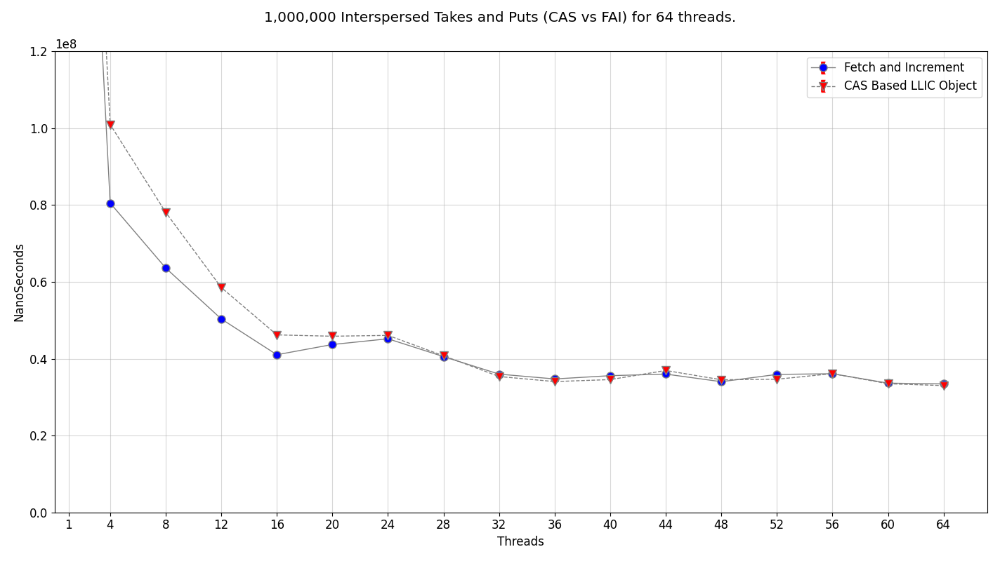

In [14]:
%matplotlib widget

json_input = 'data/LLIC/insert_extract/64/analysis-cas-fai.json'
pdf_output = 'figs/LLIC/64_insert_extract_CAS_FAI.pdf'
fig_title  = '1,000,000 Interspersed Takes and Puts (CAS vs FAI) for 64 threads.'

generate_figure(json_input, fig_title, 64, llic=True)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output, llic=True)

#### Observation

We can observe the number of cores increase to execute the calls to the Fetch&Increment instruction and the LL/IC methods, they performance is similar, in particular, they looked very similar when the number of cores executing the experiment is greater than 24.

### RW-Based LL/IC Object

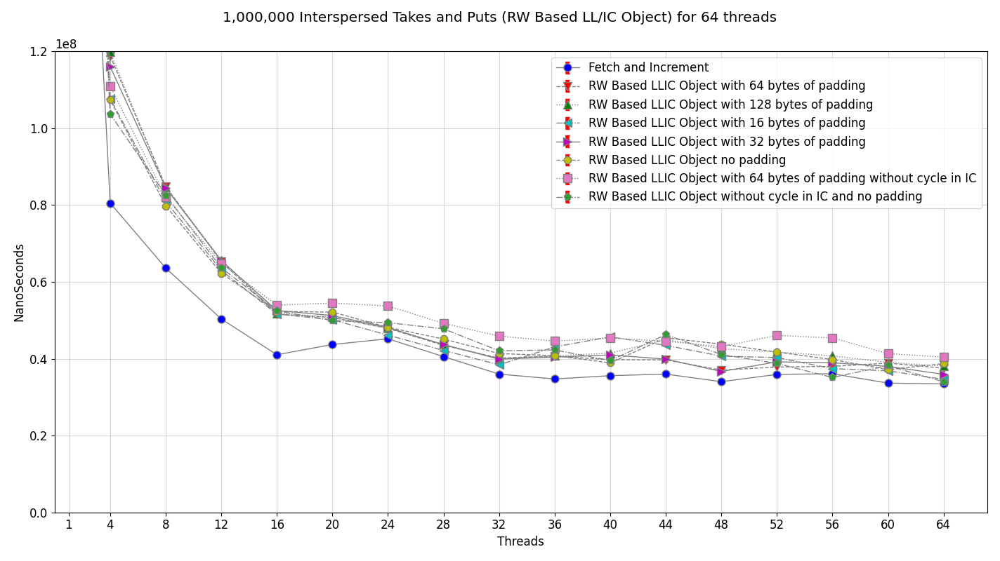

In [10]:
%matplotlib widget

json_input = 'data/LLIC/insert_extract/64/analysis-rw.json'
pdf_output = 'figs/LLIC/64_insert_extract_rw.pdf'
fig_title  = '1,000,000 Interspersed Takes and Puts (RW Based LL/IC Object) for 64 threads'

generate_figure(json_input, fig_title, 64, llic=True, ticks_size = 4)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output, llic=True)

#### Observation

The LL/IC object with 64 and 32 bytes of padding behaves very similarly, and they are virtually the best implementations in this experiment. In some moments, other implementations perform better, but their performance is inconsistent while the number of cores increases.


### Mixed implementation

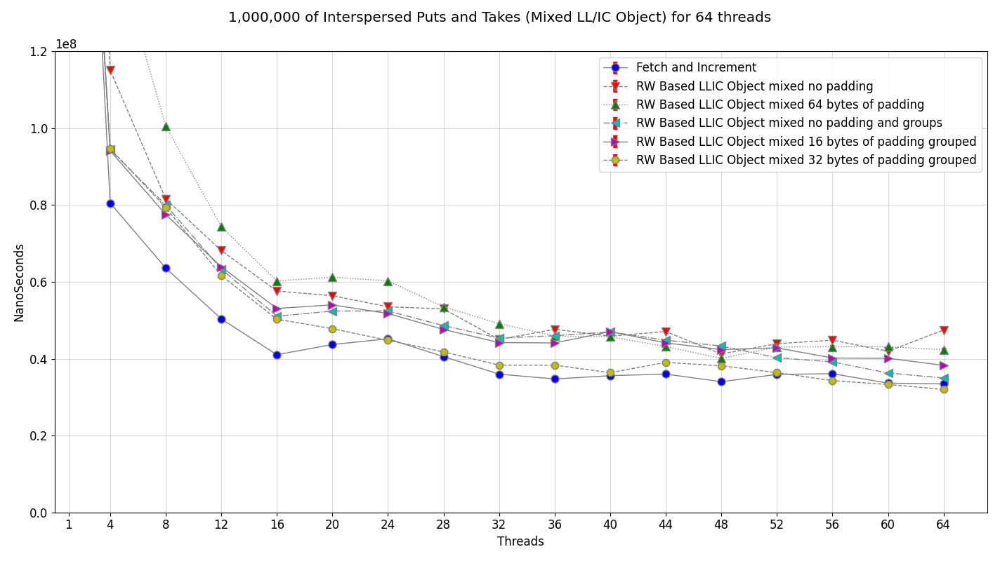

In [11]:
%matplotlib widget

json_input = 'data/LLIC/insert_extract/64/analysis-sqrt.json'
pdf_output = 'figs/LLIC/64_insert_extract_sqrt.pdf'
fig_title  = '1,000,000 of Interspersed Puts and Takes (Mixed LL/IC Object) for 64 threads'

generate_figure(json_input, fig_title, 64, llic=True)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output, llic=True)

#### Observation

Although the version **Mixed with 32 bytes of padding** performs better than the other versions when used in internal experiments, it is not better than the other versions.

One possible reason it is not better than others is its limited *progress* capacity to increment its value while there is contention at concurrent calls to LL and IC. We will confirm this when the experiments about the last value of each type of LL/IC object was done.

### Comparation for the best of each alternative

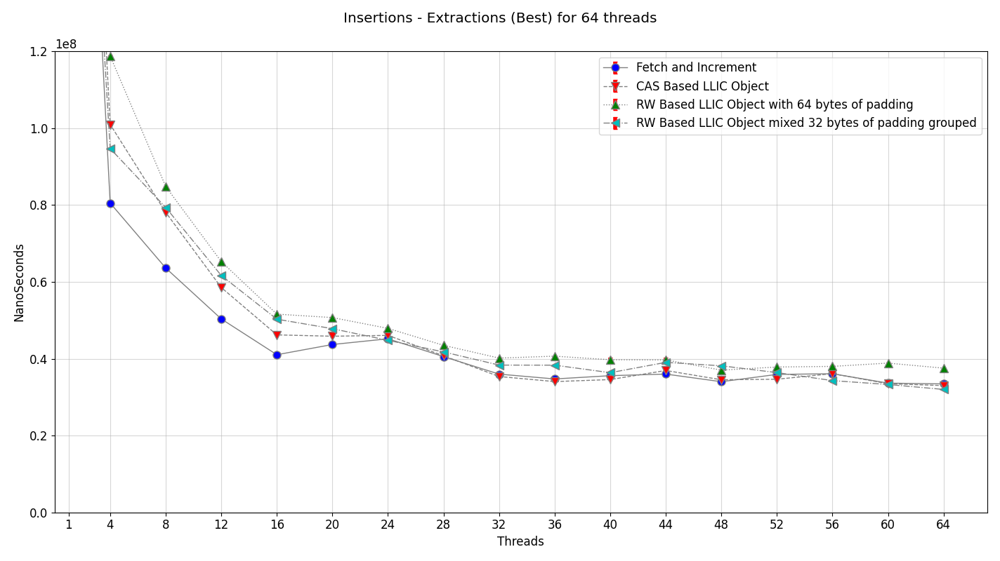

In [15]:
%matplotlib widget

json_input = 'data/LLIC/insert_extract/64/analysis-best.json'
pdf_output = 'figs/LLIC/64_insert_extract_best.pdf'
fig_title  = 'Insertions - Extractions (Best) for 64 threads'

generate_figure(json_input, fig_title, 64, llic=True)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output, llic=True)

#### Observation

After compare the CAS based version, against the R/W and mixed, we can observe they behave similar. The CAS version has the best performance in terms of time. Let's see how they behave at the moment of increment their value with contention during concurrent calls.  

##### Counter evaluation

In [108]:
df = pd.read_json('data/LLIC/counts/64/analysis.json')
means = {get_name(x['algorithm'], short_names):[s['mean'] for s in x['stats']] for x in df['results']}
m = pd.DataFrame(means)
cols = m.columns.to_list()
cols.sort()
m = m[cols]
m.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CAS LL/IC,FETCH AND INCREMENT,RW LL/IC 128 PADDING,RW LL/IC 16 PADDING,RW LL/IC 32 PADDING,RW LL/IC 64 PADDING,RW LL/IC 64 PADDING WO CYCLE,RW LL/IC MIXED 16 PADDING GROUPED,RW LL/IC MIXED NO PADDING,RW LL/IC MIXED NO PADDING GROUPED,RW LL/IC NO PADDING,RW LL/IC WO CYCLE NO PADDING
0,"1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00"
1,"808,947.80","1,000,000.00","623,406.27","848,008.87","771,682.30","884,488.20","888,594.90","879,282.63","883,325.97","872,888.20","850,832.20","883,308.67"
2,"572,714.80","999,999.00","493,037.13","559,216.63","520,977.03","567,859.03","591,799.53","580,044.10","568,874.60","565,449.20","560,650.67","608,335.33"
3,"429,522.83","1,000,000.00","402,398.67","419,198.97","412,004.83","433,883.03","445,339.63","429,724.80","407,694.13","427,847.17","431,842.20","479,643.90"
4,"310,693.93","1,000,000.00","330,417.57","335,030.17","340,689.10","358,825.37","347,657.13","354,501.00","314,663.13","305,195.40","314,175.77","403,836.50"
5,"270,080.23","999,996.00","279,313.40","270,970.57","276,099.87","299,611.67","276,746.83","274,927.87","264,852.43","266,002.03","262,561.90","298,658.13"
6,"226,366.27","999,999.00","239,562.03","232,017.63","236,473.97","253,059.87","221,670.77","232,599.23","218,222.40","227,329.30","222,412.40","245,238.13"
7,"194,324.77","1,000,000.00","212,345.97","200,880.73","208,525.83","221,278.30","192,335.77","210,727.67","191,045.20","196,892.13","191,311.83","216,961.37"
8,"171,177.33","999,999.00","191,141.07","185,272.10","188,722.53","217,774.50","175,372.07","191,261.53","170,882.43","173,668.60","170,199.97","195,774.00"
9,"174,036.17","1,000,000.00","192,909.53","187,621.67","191,361.53","207,025.10","173,149.87","190,940.60","174,541.83","178,090.03","176,422.20","188,502.97"


In [113]:
m.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CAS LL/IC,FETCH AND INCREMENT,RW LL/IC 128 PADDING,RW LL/IC 16 PADDING,RW LL/IC 32 PADDING,RW LL/IC 64 PADDING,RW LL/IC 64 PADDING WO CYCLE,RW LL/IC MIXED 16 PADDING GROUPED,RW LL/IC MIXED NO PADDING,RW LL/IC MIXED NO PADDING GROUPED,RW LL/IC NO PADDING,RW LL/IC WO CYCLE NO PADDING
count,64.00,64.00,64.00,64.00,64.00,64.00,64.00,64.00,64.00,64.00,64.00,64.00
mean,"115,715.13","999,988.05","120,622.25","123,969.52","122,909.31","135,609.79","125,569.71","130,547.63","117,245.96","118,587.43","121,066.40","133,081.77"
std,"172,272.06",14.06,"156,276.85","172,588.63","166,285.97","175,186.44","176,854.54","175,045.29","176,569.73","175,427.43","172,907.13","179,304.14"
min,"32,172.10","999,951.00","40,885.17","39,602.10","38,938.83","46,239.33","41,636.97","43,888.60","31,386.40","38,531.40","37,192.03","44,847.67"
25%,"42,886.97","999,982.50","49,576.60","51,105.75","50,272.03","54,108.45","51,284.70","53,931.50","40,097.48","44,339.82","47,505.42","57,174.43"
50%,"50,132.07","999,992.00","62,135.08","59,429.42","61,359.43","72,578.80","61,310.37","68,586.60","54,824.92","52,207.88","60,196.30","68,634.67"
75%,"95,458.91","999,999.00","105,032.88","106,702.84","105,848.99","123,817.88","98,241.67","119,291.75","106,758.64","99,818.71","105,839.73","115,414.53"
max,"1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00"


<Axes: >

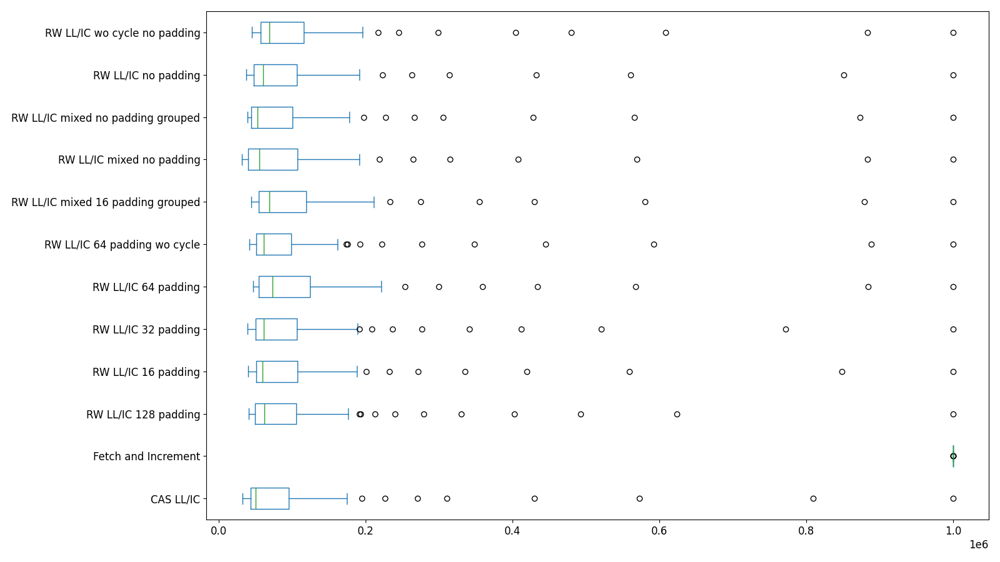

In [112]:
m.plot.box(vert=False, figsize=(16, 9))

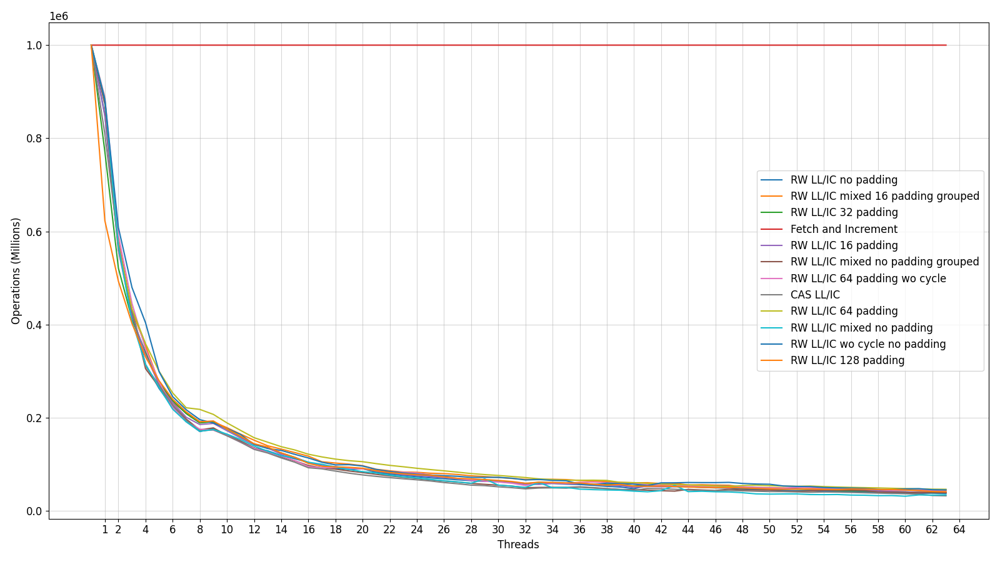

In [103]:
ax = m.plot(figsize=(16, 9))
major_ticks = np.arange(0, 64 + 1, 2)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)

## Queue evaluation 

### Inner experiments

#### Experiments for 32 threads.

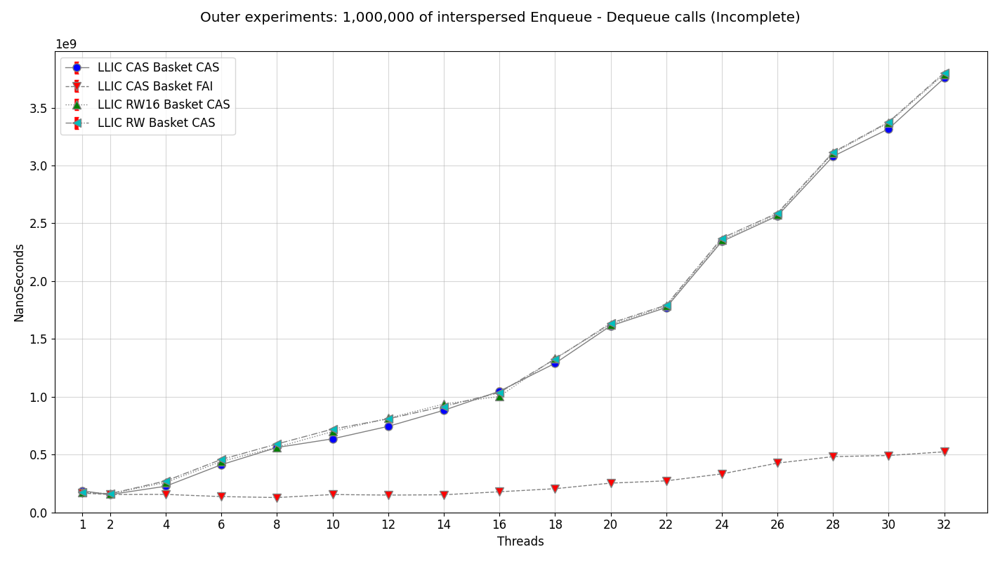

In [19]:
%matplotlib widget

json_input = 'data/queue/inner/32/analysis.json'
pdf_output = 'figs/queue/32_inner_enq_deq.pdf'
fig_title  = 'Outer experiments: 1,000,000 of interspersed Enqueue - Dequeue calls (Incomplete)'

generate_figure(json_input, fig_title, 32, ticks_size = 2)
generate_figure(json_input, fig_title, 32, generate_pdf=True, pdf_output=pdf_output)

#### Experiments for 64 threads

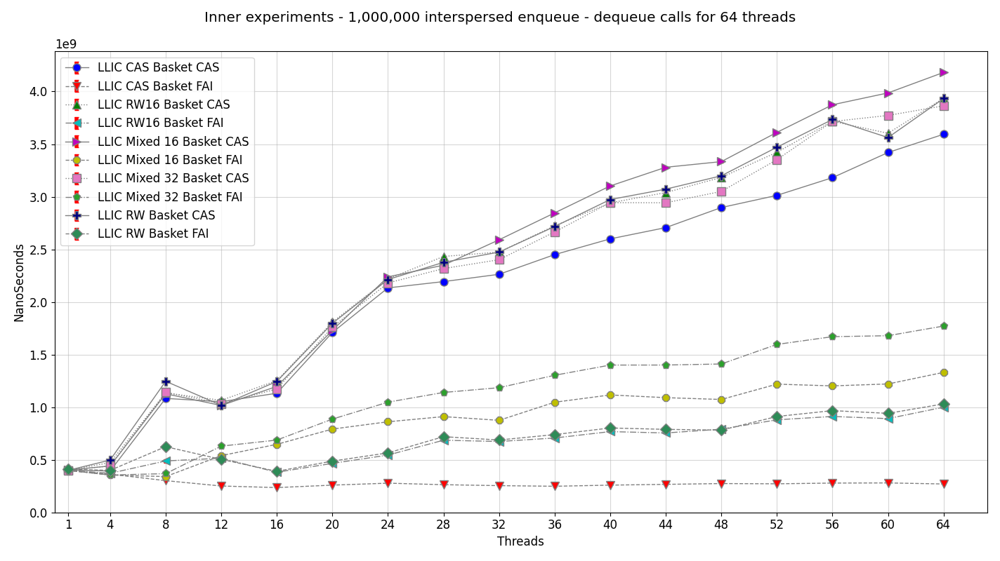

In [17]:
%matplotlib widget

json_input = 'data/queue/inner/64/analysis-all.json'
pdf_output = 'figs/queue/64_inner_enq_deq_all.pdf'
fig_title  = 'Inner experiments - 1,000,000 interspersed enqueue - dequeue calls for 64 threads'

generate_figure(json_input, fig_title, 64)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output)

### Outer experiments

#### Experiments for 32 threads

##### Enqueue and Dequeue experiments

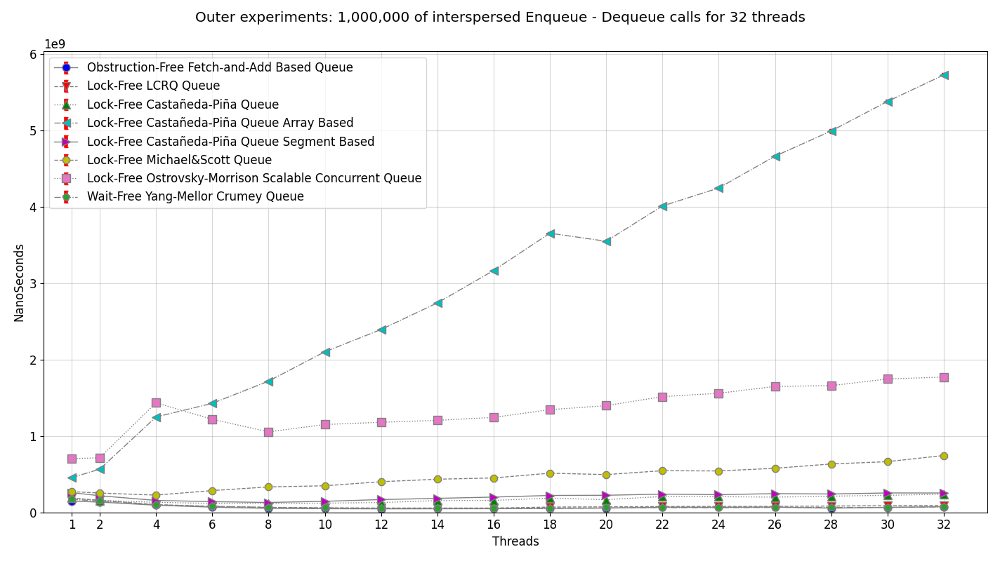

In [20]:
%matplotlib widget

json_input = 'data/queue/enq_deq/32/analysis-all.json'
pdf_output = 'figs/queue/32_enq_deq.pdf'
fig_title  = 'Outer experiments: 1,000,000 of interspersed Enqueue - Dequeue calls for 32 threads'

generate_figure(json_input, fig_title, 32, ticks_size = 2)
generate_figure(json_input, fig_title, 32, generate_pdf=True, pdf_output=pdf_output, ticks_size = 2)

In [21]:
json_input = 'data/queue/enq_deq/32/analysis-all.json'
latex_output = 'data/queue/enq_deq/32/enq-deq.tex'
label = 'enq_deq_32'
caption = 'Mean times for "Enqueue - Dequeue" experiments for 32 threads'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)


,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"188,136,999.73","455,260,386.97","258,771,864.37","147,582,438.20","185,653,909.90","272,057,892.23","703,038,501.37","169,961,229.93"
4,"132,093,287.67","1,249,015,641.80","156,976,705.23","94,644,285.13","101,723,386.50","226,478,324.67","1,433,552,134.73","99,215,359.27"
8,"115,374,039.83","1,717,519,894.00","130,092,052.03","53,271,647.57","66,598,545.33","333,694,059.23","1,053,769,575.03","64,463,864.13"
12,"129,295,617.53","2,393,255,139.67","167,958,505.57","46,680,504.33","57,400,972.70","401,791,751.83","1,179,441,691.20","52,241,437.23"
16,"157,189,746.67","3,164,749,428.87","200,759,772.80","49,546,264.17","57,208,219.67","451,080,556.80","1,243,295,831.57","48,609,351.27"
20,"167,063,269.53","3,547,618,052.87","224,434,510.80","56,143,717.13","72,539,238.20","494,796,318.97","1,397,103,752.27","59,199,789.67"
24,"205,980,433.60","4,243,828,320.77","232,468,541.77","66,943,158.37","78,419,846.90","542,489,904.33","1,558,568,046.27","61,387,714.73"
28,"212,377,588.60","4,990,426,675.47","241,404,771.53","55,904,665.13","83,884,009.60","633,945,760.20","1,658,859,494.07","65,867,078.47"
32,"238,315,426.67","5,723,460,463.57","253,954,835.07","74,220,047.63","91,142,936.33","744,612,148.40","1,770,773,976.60","72,820,183.33"


In [22]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,9.00,9.00,9.00,9.00,9.00,9.00,9.00,9.00
mean,"171,758,489.98","3,053,903,778.22","207,424,617.69","71,659,636.41","88,285,673.90","455,660,746.30","1,333,155,889.23","77,085,112.00"
std,"42,292,223.59","1,760,027,057.94","46,097,855.25","32,135,272.78","39,408,078.73","168,961,040.09","329,654,994.68","37,771,386.46"
min,"115,374,039.83","455,260,386.97","130,092,052.03","46,680,504.33","57,208,219.67","226,478,324.67","703,038,501.37","48,609,351.27"
25%,"132,093,287.67","1,717,519,894.00","167,958,505.57","53,271,647.57","66,598,545.33","333,694,059.23","1,179,441,691.20","59,199,789.67"
50%,"167,063,269.53","3,164,749,428.87","224,434,510.80","56,143,717.13","78,419,846.90","451,080,556.80","1,397,103,752.27","64,463,864.13"
75%,"205,980,433.60","4,243,828,320.77","241,404,771.53","74,220,047.63","91,142,936.33","542,489,904.33","1,558,568,046.27","72,820,183.33"
max,"238,315,426.67","5,723,460,463.57","258,771,864.37","147,582,438.20","185,653,909.90","744,612,148.40","1,770,773,976.60","169,961,229.93"


In [23]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,-10.69,-167.86,-52.25,13.17,-9.23,-60.07,-313.65,0.00
4,-33.14,"-1,158.89",-58.22,4.61,-2.53,-128.27,"-1,344.89",0.00
8,-78.97,"-2,564.31",-101.81,17.36,-3.31,-417.65,"-1,534.67",0.00
12,-147.50,"-4,481.14",-221.50,10.64,-9.88,-669.11,"-2,157.67",0.00
16,-223.37,"-6,410.58",-313.01,-1.93,-17.69,-827.97,"-2,457.73",0.00
20,-182.20,"-5,892.62",-279.11,5.16,-22.53,-735.81,"-2,259.98",0.00
24,-235.54,"-6,813.16",-278.69,-9.05,-27.75,-783.71,"-2,438.89",0.00
28,-222.43,"-7,476.51",-266.50,15.13,-27.35,-862.46,"-2,418.50",0.00
32,-227.27,"-7,759.72",-248.74,-1.92,-25.16,-922.54,"-2,331.71",0.00


In [24]:
operations = result.apply(lambda x: 1000000 / (x / 1000000000), axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"5,315,275.58","2,196,545.16","3,864,407.76","6,775,873.96","5,386,366.50","3,675,688.26","1,422,397.21","5,883,694.77"
4,"7,570,407.38","800,630.49","6,370,371.95","10,565,878.32","9,830,581.09","4,415,433.58","697,567.93","10,079,084.60"
8,"8,667,461.08","582,234.89","7,686,864.68","18,771,711.51","15,015,342.98","2,996,756.98","948,974.07","15,512,566.82"
12,"7,734,214.19","417,840.95","5,953,851.50","21,422,219.28","17,421,307.57","2,488,851.49","847,858.79","19,141,892.97"
16,"6,361,738.10","315,980.78","4,981,077.56","20,183,156.43","17,480,005.60","2,216,898.92","804,313.80","20,572,173.34"
20,"5,985,756.19","281,879.27","4,455,642.75","17,811,432.00","13,785,642.43","2,021,033.63","715,766.45","16,891,951.91"
24,"4,854,830.06","235,636.30","4,301,657.30","14,938,046.31","12,751,873.91","1,843,352.28","641,614.59","16,289,904.33"
28,"4,708,594.76","200,383.67","4,142,420.19","17,887,594.85","11,921,223.18","1,577,422.02","602,823.81","15,182,091.32"
32,"4,196,119.46","174,719.47","3,937,708.06","13,473,448.64","10,971,777.30","1,342,981.04","564,724.81","13,732,456.50"


<Axes: title={'center': 'Enqueue-dequeue pairs performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

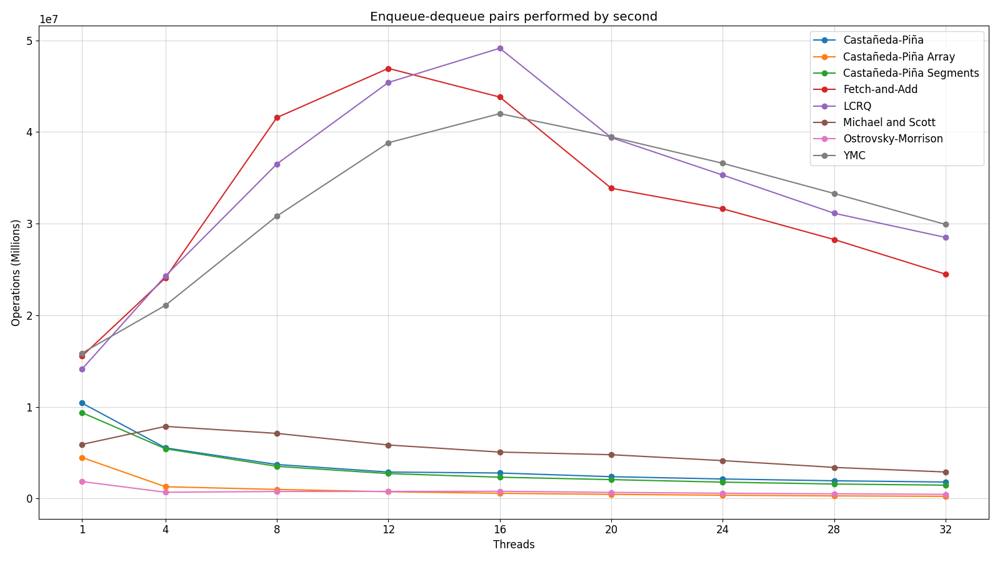

In [47]:
ax = operations.plot(marker='o', title='Enqueue-dequeue pairs performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 32 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax

##### Only Enqueue Experiments

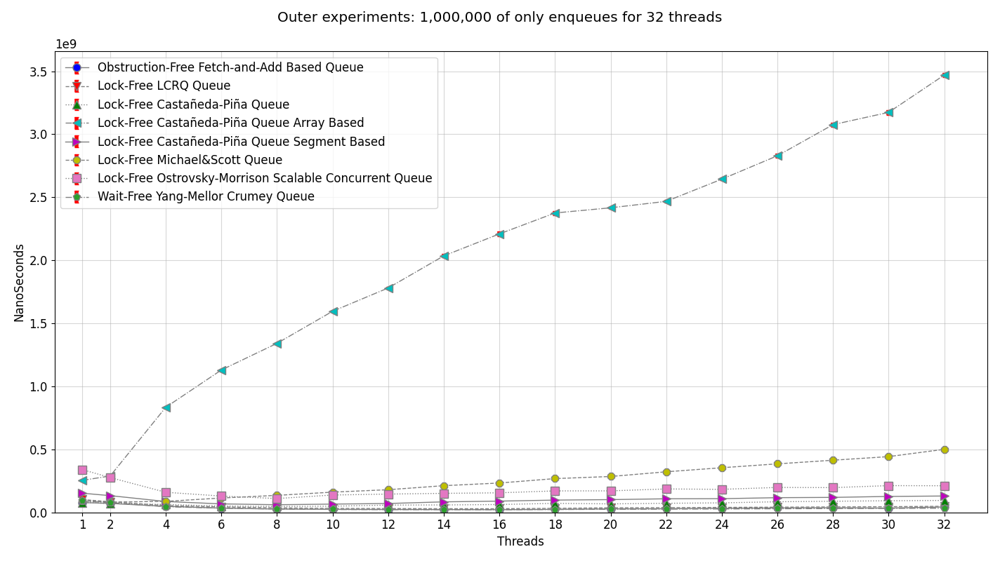

In [25]:
%matplotlib widget

json_input = 'data/queue/only_enq/32/analysis.json'
pdf_output = 'figs/queue/32_only_enq.pdf'
fig_title  = 'Outer experiments: 1,000,000 of only enqueues for 32 threads'

generate_figure(json_input, fig_title, 32, ticks_size = 2)
generate_figure(json_input, fig_title, 32, generate_pdf=True, pdf_output=pdf_output, ticks_size = 2)

In [48]:
json_input = 'data/queue/only_enq/32/analysis.json'
latex_output = 'data/queue/only_enq/32/only_enq.tex'
label = 'only_enq_32'
caption = 'Mean times for "Only-Enqueue" experiments for 32 threads (milliseconds to execute 1,000,000 of operations)'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

#result = result.apply(lambda x: x / 1000000)

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"79,076,467.53","254,604,058.90","152,444,204.57","78,484,534.47","102,268,868.43","92,698,111.20","339,562,240.07","90,330,599.27"
4,"63,232,252.43","833,842,701.60","86,662,541.23","48,316,516.97","54,352,117.53","87,732,475.03","159,754,058.17","45,040,696.07"
8,"47,671,966.30","1,341,152,214.87","61,050,024.13","26,630,693.33","36,566,011.23","135,408,803.40","110,119,480.20","27,011,749.10"
12,"58,070,459.40","1,780,503,672.13","70,828,603.90","23,208,596.97","30,305,312.20","180,208,775.87","145,465,932.80","22,063,426.17"
16,"62,685,881.97","2,209,463,091.23","89,768,819.37","21,581,060.60","29,113,699.60","233,288,784.53","155,532,342.93","21,380,739.43"
20,"67,717,023.90","2,416,586,495.83","101,636,904.13","27,878,120.00","36,652,356.90","285,067,453.67","171,024,483.47","24,895,584.27"
24,"75,823,046.50","2,643,777,135.53","109,067,267.90","32,997,594.77","39,756,287.93","354,548,481.07","183,143,924.27","27,613,766.97"
28,"88,708,011.83","3,076,337,682.10","119,234,804.77","36,925,387.27","43,595,262.70","414,156,861.13","196,760,600.67","30,671,991.17"
32,"95,131,082.97","3,469,768,623.50","130,245,873.17","43,282,163.13","48,702,861.73","500,541,896.90","211,606,270.23","33,618,484.30"


In [49]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,9.00,9.00,9.00,9.00,9.00,9.00,9.00,9.00
mean,"70,901,799.20","2,002,892,852.86","102,326,560.35","37,700,518.61","46,812,530.92","253,739,071.42","185,885,481.42","35,847,448.53"
std,"15,148,835.49","1,051,136,543.71","28,987,065.73","17,743,948.66","22,332,495.02","146,248,443.74","64,810,425.37","21,649,984.20"
min,"47,671,966.30","254,604,058.90","61,050,024.13","21,581,060.60","29,113,699.60","87,732,475.03","110,119,480.20","21,380,739.43"
25%,"62,685,881.97","1,341,152,214.87","86,662,541.23","26,630,693.33","36,566,011.23","135,408,803.40","155,532,342.93","24,895,584.27"
50%,"67,717,023.90","2,209,463,091.23","101,636,904.13","32,997,594.77","39,756,287.93","233,288,784.53","171,024,483.47","27,613,766.97"
75%,"79,076,467.53","2,643,777,135.53","119,234,804.77","43,282,163.13","48,702,861.73","354,548,481.07","196,760,600.67","33,618,484.30"
max,"95,131,082.97","3,469,768,623.50","152,444,204.57","78,484,534.47","102,268,868.43","500,541,896.90","339,562,240.07","90,330,599.27"


In [50]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,12.46,-181.86,-68.76,13.11,-13.22,-2.62,-275.91,0.00
4,-40.39,"-1,751.31",-92.41,-7.27,-20.67,-94.78,-254.69,0.00
8,-76.49,"-4,865.07",-126.01,1.41,-35.37,-401.30,-307.67,0.00
12,-163.20,"-7,969.93",-221.02,-5.19,-37.36,-716.78,-559.31,0.00
16,-193.19,"-10,233.89",-319.86,-0.94,-36.17,-991.12,-627.44,0.00
20,-172.00,"-9,606.89",-308.25,-11.98,-47.22,"-1,045.05",-586.97,0.00
24,-174.58,"-9,474.13",-294.97,-19.50,-43.97,"-1,183.96",-563.23,0.00
28,-189.22,"-9,929.79",-288.74,-20.39,-42.13,"-1,250.28",-541.50,0.00
32,-182.97,"-10,221.01",-287.42,-28.75,-44.87,"-1,388.89",-529.43,0.00


In [51]:
operations = result.apply(lambda x: 1000000 / (x / 1000000000), axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"12,645,987.25","3,927,667.16","6,559,777.09","12,741,363.72","9,778,146.72","10,787,706.32","2,944,968.20","11,070,445.76"
4,"15,814,714.19","1,199,266.96","11,539,010.81","20,696,856.12","18,398,547.20","11,398,287.80","6,259,621.89","22,202,143.56"
8,"20,976,688.77","745,627.52","16,380,009.90","37,550,655.83","27,347,801.04","7,385,044.21","9,081,045.41","37,020,927.31"
12,"17,220,459.60","561,638.83","14,118,589.74","43,087,481.83","32,997,515.20","5,549,119.32","6,874,461.81","45,323,876.38"
16,"15,952,555.32","452,598.64","11,139,725.43","46,336,925.63","34,348,090.89","4,286,532.69","6,429,530.87","46,771,067.16"
20,"14,767,335.34","413,806.83","9,838,945.89","35,870,424.55","27,283,375.06","3,507,941.67","5,847,116.04","40,167,765.87"
24,"13,188,602.23","378,246.71","9,168,653.61","30,305,239.13","25,153,253.79","2,820,488.74","5,460,186.59","36,213,820.49"
28,"11,272,938.93","325,061.84","8,386,812.91","27,081,638.79","22,938,272.14","2,414,544.09","5,082,318.29","32,603,034.95"
32,"10,511,811.37","288,203.66","7,677,786.45","23,104,205.70","20,532,674.35","1,997,834.76","4,725,757.88","29,745,540.91"


<Axes: title={'center': 'Enqueues performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

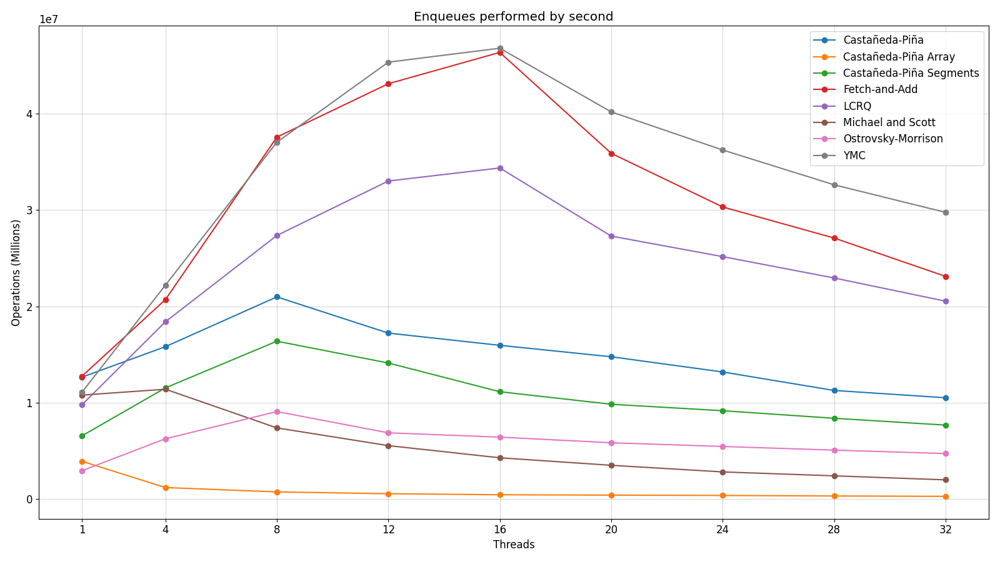

In [53]:
ax = operations.plot(marker='o', title='Enqueues performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 32 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax

##### Only Dequeue Experiments

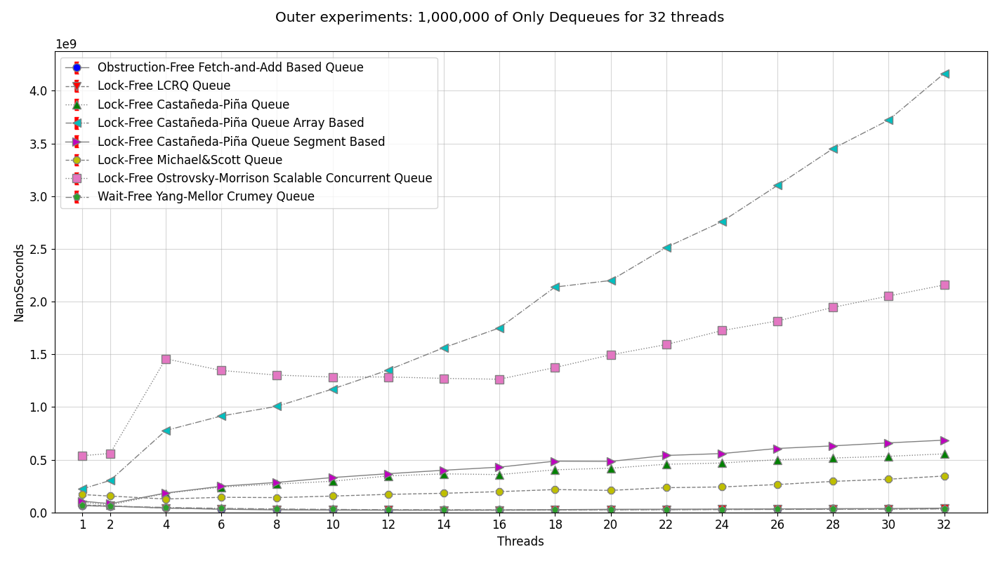

In [30]:
%matplotlib widget

json_input = 'data/queue/only_deq/32/analysis.json'
pdf_output = 'figs/queue/32_only_deq.pdf'
fig_title  = 'Outer experiments: 1,000,000 of Only Dequeues for 32 threads'

generate_figure(json_input, fig_title, 32, ticks_size = 2)
generate_figure(json_input, fig_title, 32, generate_pdf=True, pdf_output=pdf_output, ticks_size = 2)

In [54]:
json_input = 'data/queue/only_deq/32/analysis.json'
latex_output = 'data/queue/only_deq/32/only_deq.tex'
label = 'only_deq_32'
caption = 'Mean times for "Only-Dequeue" experiments for 32 threads'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

#result = result.apply(lambda x: x / 1000000)

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"95,956,533.80","223,060,854.60","106,622,671.90","64,395,628.57","70,858,557.57","169,347,239.07","538,327,333.37","63,050,019.63"
4,"180,910,531.97","777,062,653.13","183,976,903.90","41,526,216.87","41,162,980.43","127,008,192.20","1,457,324,933.07","47,424,504.07"
8,"269,187,988.23","1,006,443,861.33","284,581,944.13","24,050,637.47","27,384,931.90","140,664,503.90","1,302,439,362.90","32,438,353.17"
12,"346,063,152.80","1,350,470,753.87","367,265,551.60","21,302,498.03","22,023,410.83","171,145,953.13","1,284,912,331.00","25,756,193.17"
16,"358,855,099.77","1,750,064,675.37","429,533,543.53","22,823,900.20","20,348,185.57","197,228,765.63","1,263,418,058.70","23,806,148.30"
20,"419,406,076.53","2,199,670,259.90","484,098,880.30","29,531,312.50","25,385,881.10","209,023,787.40","1,494,738,357.87","25,337,687.13"
24,"468,621,944.50","2,758,178,105.97","558,343,159.17","31,624,442.97","28,327,096.73","241,639,000.00","1,724,219,469.73","27,332,438.73"
28,"516,178,055.60","3,450,875,678.07","631,362,747.03","35,374,781.93","32,118,526.00","294,383,987.43","1,945,131,638.17","30,037,290.50"
32,"555,443,095.23","4,163,902,982.23","685,530,364.27","40,848,041.47","35,092,048.23","345,254,823.43","2,157,642,365.83","33,431,413.47"


In [55]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,9.00,9.00,9.00,9.00,9.00,9.00,9.00,9.00
mean,"356,735,830.94","1,964,414,424.94","414,590,640.65","34,608,606.67","33,633,513.15","210,632,916.91","1,463,128,205.63","34,290,449.80"
std,"153,319,870.56","1,299,779,779.14","197,891,018.88","13,401,139.28","15,384,001.36","71,966,431.58","465,913,263.64","12,909,268.95"
min,"95,956,533.80","223,060,854.60","106,622,671.90","21,302,498.03","20,348,185.57","127,008,192.20","538,327,333.37","23,806,148.30"
25%,"269,187,988.23","1,006,443,861.33","284,581,944.13","24,050,637.47","25,385,881.10","169,347,239.07","1,284,912,331.00","25,756,193.17"
50%,"358,855,099.77","1,750,064,675.37","429,533,543.53","31,624,442.97","28,327,096.73","197,228,765.63","1,457,324,933.07","30,037,290.50"
75%,"468,621,944.50","2,758,178,105.97","558,343,159.17","40,848,041.47","35,092,048.23","241,639,000.00","1,724,219,469.73","33,431,413.47"
max,"555,443,095.23","4,163,902,982.23","685,530,364.27","64,395,628.57","70,858,557.57","345,254,823.43","2,157,642,365.83","63,050,019.63"


In [56]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,-52.19,-253.78,-69.11,-2.13,-12.38,-168.59,-753.81,0.00
4,-281.47,"-1,538.53",-287.94,12.44,13.20,-167.81,"-2,972.94",0.00
8,-729.84,"-3,002.64",-777.30,25.86,15.58,-333.64,"-3,915.12",0.00
12,"-1,243.61","-5,143.29","-1,325.93",17.29,14.49,-564.48,"-4,888.75",0.00
16,"-1,407.41","-7,251.31","-1,704.30",4.13,14.53,-728.48,"-5,207.11",0.00
20,"-1,555.27","-8,581.42","-1,810.59",-16.55,-0.19,-724.95,"-5,799.27",0.00
24,"-1,614.53","-9,991.23","-1,942.79",-15.70,-3.64,-784.07,"-6,208.33",0.00
28,"-1,618.46","-11,388.64","-2,001.93",-17.77,-6.93,-880.06,"-6,375.72",0.00
32,"-1,561.44","-12,355.06","-1,950.56",-22.18,-4.97,-932.73,"-6,353.94",0.00


In [57]:
operations = result.apply(lambda x: 1000000 / (x / 1000000000), axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"10,421,385.19","4,483,081.54","9,378,868.32","15,529,004.41","14,112,621.46","5,905,026.89","1,857,605.84","15,860,423.29"
4,"5,527,594.16","1,286,897.52","5,435,464.88","24,081,172.70","24,293,673.33","7,873,507.86","686,188.77","21,086,145.65"
8,"3,714,876.01","993,597.40","3,513,926.38","41,578,939.49","36,516,431.87","7,109,114.04","767,790.06","30,827,705.55"
12,"2,889,645.98","740,482.53","2,722,825.48","46,942,851.42","45,406,227.38","5,842,966.09","778,263.21","38,825,613.46"
16,"2,786,640.07","571,407.45","2,328,106.88","43,813,721.20","49,144,430.92","5,070,254.32","791,503.65","42,005,955.24"
20,"2,384,324.06","454,613.59","2,065,693.69","33,862,362.20","39,391,975.25","4,784,144.49","669,013.41","39,466,901.41"
24,"2,133,916.29","362,558.17","1,791,013.26","31,621,110.32","35,301,888.13","4,138,404.81","579,972.57","36,586,563.31"
28,"1,937,315.99","289,781.52","1,583,875.52","28,268,725.50","31,134,679.09","3,396,923.89","514,104.02","33,291,950.88"
32,"1,800,364.45","240,159.29","1,458,724.59","24,480,977.89","28,496,484.26","2,896,411.38","463,468.84","29,911,986.85"


<Axes: title={'center': 'Dequeues performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

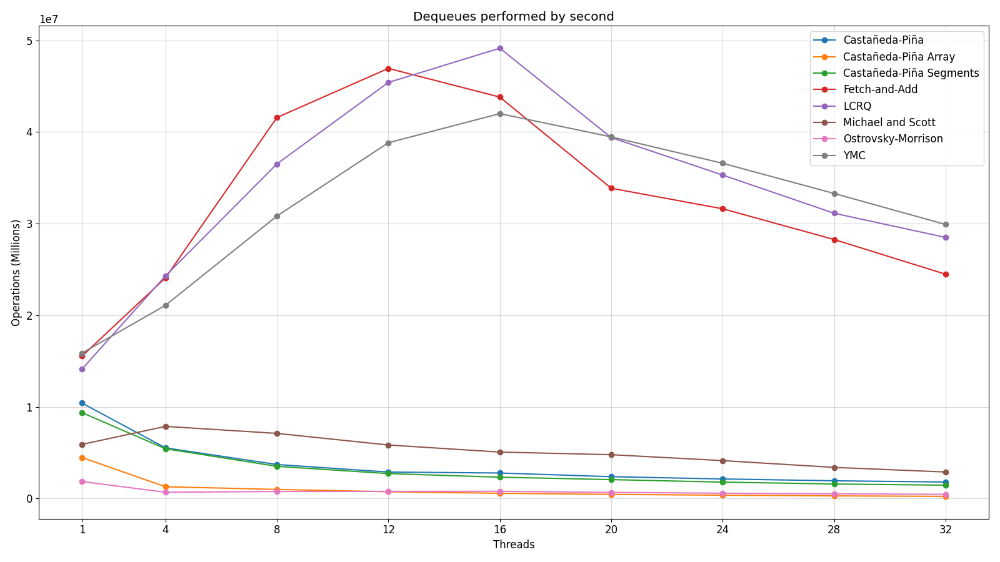

In [58]:
ax = operations.plot(marker='o', title='Dequeues performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 32 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax

#### Experiments for 64 threads.

##### Enqueue and Dequeue Experiments

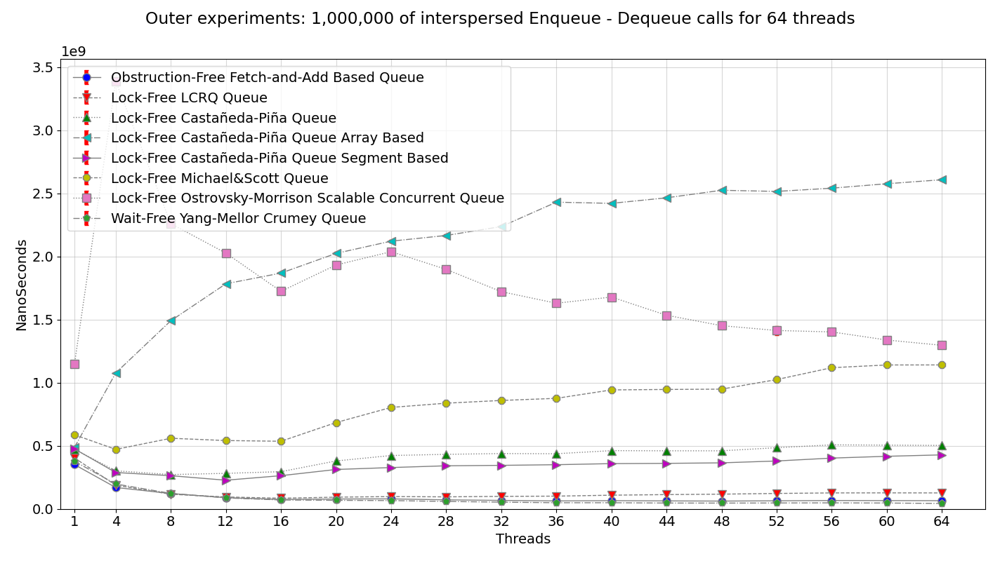

In [69]:
%matplotlib widget

json_input = '../../phd/basket-project/statistics_basket/data/queue/enq_deq/64/analysis-all.json'
pdf_output = './figs/queue/64_enq_deq_all.pdf'
fig_title  = 'Outer experiments: 1,000,000 of interspersed Enqueue - Dequeue calls for 64 threads'

generate_figure(json_input, fig_title, 64)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output)

In [60]:
json_input = 'data/queue/enq_deq/64/analysis-all.json'
latex_output = 'data/queue/enq_deq/64/enq-deq.tex'
label = 'enq_deq_64'
caption = 'Mean times for "Enqueue - Dequeue" experiments for 64 threads'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

result = result.apply(lambda x: x / 1000000)

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,472.56,487.17,475.51,351.20,403.57,587.25,"1,146.25",377.30
4,301.83,"1,077.15",288.44,169.69,187.82,471.54,"3,387.29",197.39
8,272.04,"1,490.50",263.05,121.85,116.03,559.54,"2,259.38",122.92
12,281.70,"1,783.32",227.34,88.99,94.77,541.61,"2,026.16",87.40
16,294.98,"1,867.96",263.26,74.78,84.62,535.91,"1,723.49",70.82
20,380.00,"2,023.93",312.41,78.63,93.05,684.01,"1,932.15",67.94
24,422.92,"2,120.92",327.65,79.54,97.72,803.99,"2,037.76",66.01
28,432.41,"2,166.06",341.57,71.82,95.51,837.46,"1,897.40",59.07
32,438.54,"2,236.55",345.09,67.44,99.41,859.15,"1,720.95",53.67
36,437.12,"2,429.72",350.20,63.24,101.22,875.83,"1,629.21",48.97


In [61]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,418.63,"2,078.29",347.41,95.29,130.34,824.57,"1,757.25",86.96
std,81.67,589.94,64.31,71.43,74.17,224.83,517.52,84.24
min,272.04,487.17,227.34,62.15,84.62,471.54,"1,146.25",43.24
25%,380.00,"1,867.96",312.41,65.18,97.72,587.25,"1,413.33",47.10
50%,438.54,"2,236.55",350.20,67.44,113.39,859.15,"1,678.29",53.67
75%,472.56,"2,514.99",379.65,79.54,126.73,948.74,"1,932.15",70.82
max,507.51,"2,607.57",475.51,351.20,403.57,"1,140.57","3,387.29",377.30


In [62]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,-25.25,-29.12,-26.03,6.92,-6.96,-55.65,-203.81,0.00
4,-52.91,-445.68,-46.12,14.03,4.85,-138.88,"-1,616.00",0.00
8,-121.32,"-1,112.60",-114.00,0.87,5.61,-355.21,"-1,738.11",0.00
12,-222.33,"-1,940.49",-160.13,-1.83,-8.44,-519.71,"-2,218.35",0.00
16,-316.54,"-2,537.73",-271.74,-5.59,-19.50,-656.75,"-2,333.73",0.00
20,-459.30,"-2,878.93",-359.82,-15.73,-36.96,-906.76,"-2,743.84",0.00
24,-540.67,"-3,112.91",-396.35,-20.50,-48.03,"-1,117.93","-2,986.94",0.00
28,-632.09,"-3,567.19",-478.29,-21.59,-61.70,"-1,317.84","-3,112.34",0.00
32,-717.10,"-4,067.25",-542.98,-25.66,-85.23,"-1,500.82","-3,106.55",0.00
36,-792.62,"-4,861.60",-615.13,-29.14,-106.69,"-1,688.49","-3,226.92",0.00


In [63]:
def ops(x):
    return 1000000 / (x / 1000)


operations = result.apply(ops, axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"2,116,153.32","2,052,690.95","2,102,998.65","2,847,380.19","2,477,870.09","1,702,855.57","872,408.73","2,650,430.68"
4,"3,313,127.19","928,375.71","3,466,978.64","5,893,025.81","5,324,221.57","2,120,691.62","295,221.07","5,065,996.71"
8,"3,675,956.74","670,914.32","3,801,603.87","8,206,483.05","8,618,738.21","1,787,187.61","442,598.87","8,135,475.27"
12,"3,549,827.39","560,751.52","4,398,644.38","11,236,708.01","10,551,844.96","1,846,359.54","493,543.94","11,442,094.04"
16,"3,390,076.08","535,342.99","3,798,583.36","13,373,231.50","11,817,141.95","1,865,988.50","580,216.90","14,120,910.64"
20,"2,631,613.27","494,089.30","3,200,933.04","12,718,121.70","10,746,811.59","1,461,971.14","517,559.05","14,718,573.58"
24,"2,364,514.20","471,494.38","3,051,992.30","12,571,769.18","10,233,222.51","1,243,803.45","490,735.83","15,148,698.00"
28,"2,312,594.25","461,667.09","2,927,649.28","13,924,171.22","10,470,125.99","1,194,084.01","527,036.31","16,930,217.27"
32,"2,280,303.39","447,116.33","2,897,814.81","14,827,178.81","10,059,083.78","1,163,934.58","581,075.89","18,632,462.59"
36,"2,287,691.50","411,570.81","2,855,478.31","15,812,554.32","9,879,701.67","1,141,774.83","613,795.05","20,420,490.07"


In [64]:
operations.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,"2,496,117.72","577,183.76","2,979,752.68","12,922,417.17","8,738,877.90","1,313,195.75","605,334.70","16,318,418.58"
std,"590,554.35","404,291.14","596,756.26","3,836,365.81","2,218,245.45","401,388.92","140,072.31","6,245,277.67"
min,"1,970,415.05","383,498.28","2,102,998.65","2,847,380.19","2,477,870.09","876,752.72","295,221.07","2,650,430.68"
25%,"2,116,153.32","397,616.26","2,633,996.08","12,571,769.18","7,890,769.35","1,054,033.53","517,559.05","14,120,910.64"
50%,"2,280,303.39","447,116.33","2,855,478.31","14,827,178.81","8,819,465.63","1,163,934.58","595,845.41","18,632,462.59"
75%,"2,631,613.27","535,342.99","3,200,933.04","15,342,479.67","10,233,222.51","1,702,855.57","707,547.66","21,233,608.27"
max,"3,675,956.74","2,052,690.95","4,398,644.38","16,090,492.91","11,817,141.95","2,120,691.62","872,408.73","23,129,094.15"


<Axes: title={'center': 'Enqueue-dequeue pairs performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

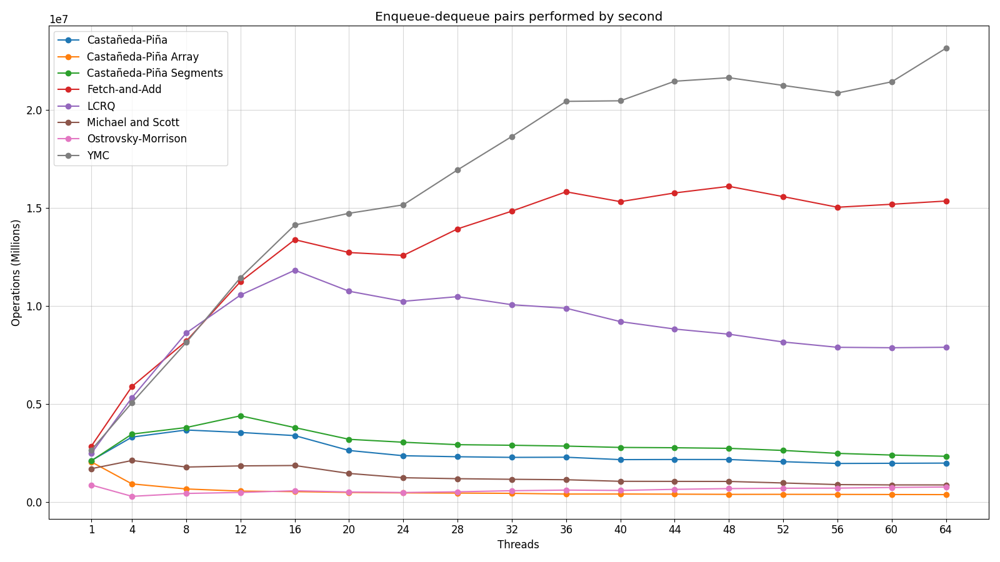

In [66]:
ax = operations.plot(marker='o', title='Enqueue-dequeue pairs performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 64 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax

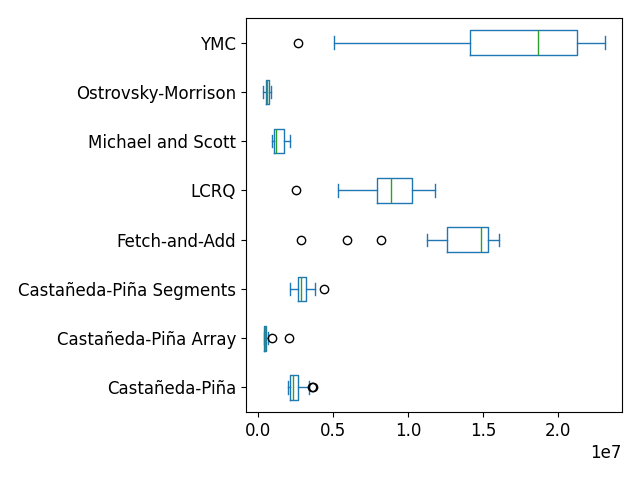

In [137]:

box = operations.plot.box(vert=False)


##### Only Enqueue Experiments

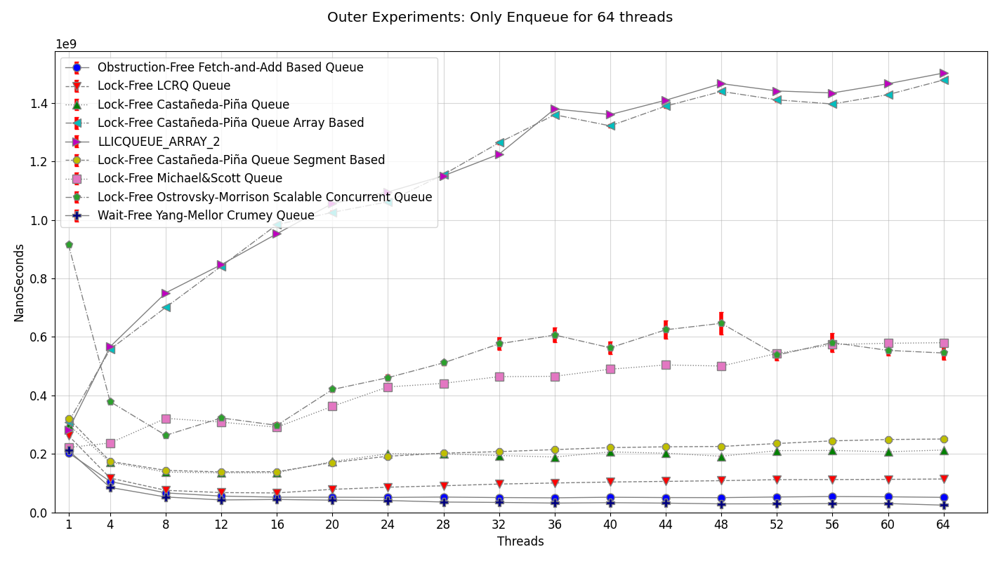

In [67]:
%matplotlib widget

json_input = 'data/queue/only_enq/64/analysis.json'
pdf_output = 'figs/queue/64_only_enq.pdf'
fig_title  = 'Outer Experiments: Only Enqueue for 64 threads'

generate_figure(json_input, fig_title, 64)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output)

In [85]:
json_input = 'data/queue/only_enq/64/analysis.json'
latex_output = 'data/queue/only_enq/64/only_enq.tex'
label = 'only_enq_64'
caption = 'Mean times for "Only-Enqueue" experiments for 64 threads'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,LLICQUEUE_ARRAY_2,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"300,207,189.17","309,093,029.80","321,227,233.30","203,834,453.13","262,432,326.77","282,315,380.43","221,865,208.03","915,198,507.90","211,609,250.97"
4,"171,145,913.63","557,788,972.90","174,484,169.17","105,822,598.37","117,532,234.17","566,690,003.73","237,404,872.03","378,583,614.67","85,329,432.73"
8,"137,969,770.37","700,987,298.17","143,768,846.83","66,699,371.87","75,554,856.00","750,720,297.57","321,687,048.77","263,565,422.80","52,737,481.53"
12,"135,370,858.47","841,909,119.17","138,487,006.23","55,871,835.43","67,863,356.10","847,120,960.73","308,758,025.30","322,992,538.17","42,668,703.73"
16,"135,656,456.97","983,737,099.20","139,219,207.87","52,156,957.90","66,624,048.17","952,736,874.57","291,380,003.57","297,742,012.47","44,240,223.23"
20,"174,157,260.40","1,025,866,813.87","170,688,871.47","51,960,794.93","78,925,250.70","1,056,333,968.73","362,813,019.00","420,218,900.10","41,844,047.20"
24,"200,483,985.87","1,062,111,523.33","192,175,860.33","51,419,172.97","86,245,120.70","1,095,612,919.57","429,082,822.47","460,799,041.30","40,684,100.03"
28,"200,179,885.80","1,155,183,636.33","202,604,367.33","52,492,429.50","91,099,024.03","1,151,059,423.93","441,383,784.43","511,372,891.87","35,530,093.60"
32,"194,467,765.77","1,264,218,054.07","207,832,462.30","50,802,916.57","97,027,788.17","1,224,825,159.20","464,145,712.27","576,465,669.60","34,181,253.90"
36,"189,474,100.97","1,359,567,003.83","214,776,121.17","49,928,669.07","100,596,564.50","1,379,467,575.90","465,433,699.43","606,589,498.57","31,948,610.70"


In [69]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,LLICQUEUE_ARRAY_2,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,"193,210,183.29","1,124,984,407.39","209,244,135.52","65,061,170.27","106,710,756.60","1,140,333,497.02","430,250,880.53","517,935,053.01","48,815,801.32"
std,"38,471,872.79","347,855,741.79","47,258,574.62","38,160,499.14","43,435,888.17","358,132,394.46","118,665,970.44","155,893,203.21","44,196,219.01"
min,"135,370,858.47","309,093,029.80","138,487,006.23","49,928,669.07","66,624,048.17","282,315,380.43","221,865,208.03","263,565,422.80","24,818,765.20"
25%,"174,157,260.40","983,737,099.20","174,484,169.17","51,419,172.97","86,245,120.70","952,736,874.57","321,687,048.77","420,218,900.10","30,357,640.00"
50%,"200,179,885.80","1,264,218,054.07","214,776,121.17","52,156,957.90","103,915,790.97","1,224,825,159.20","464,145,712.27","545,094,589.90","34,181,253.90"
75%,"207,391,012.50","1,396,432,197.13","235,543,419.30","54,301,809.73","112,352,422.50","1,434,128,809.87","504,160,969.47","580,571,509.60","42,668,703.73"
max,"300,207,189.17","1,478,653,158.37","321,227,233.30","203,834,453.13","262,432,326.77","1,502,281,195.97","580,243,367.63","915,198,507.90","211,609,250.97"


In [70]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,LLICQUEUE_ARRAY_2,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,-41.87,-46.07,-51.80,3.67,-24.02,-33.41,-4.85,-332.49,0.00
4,-100.57,-553.69,-104.48,-24.02,-37.74,-564.12,-178.22,-343.67,0.00
8,-161.62,"-1,229.20",-172.61,-26.47,-43.27,"-1,323.50",-509.98,-399.77,0.00
12,-217.26,"-1,873.13",-224.56,-30.94,-59.05,"-1,885.34",-623.62,-656.98,0.00
16,-206.64,"-2,123.63",-214.69,-17.89,-50.60,"-2,053.55",-558.63,-573.01,0.00
20,-316.21,"-2,351.64",-307.92,-24.18,-88.62,"-2,424.45",-767.06,-904.25,0.00
24,-392.78,"-2,510.63",-372.36,-26.39,-111.99,"-2,592.98",-954.67,"-1,032.63",0.00
28,-463.41,"-3,151.28",-470.23,-47.74,-156.40,"-3,139.67","-1,142.28","-1,339.27",0.00
32,-468.93,"-3,598.57",-508.03,-48.63,-183.86,"-3,483.32","-1,257.90","-1,586.50",0.00
36,-493.06,"-4,155.48",-572.25,-56.28,-214.87,"-4,217.77","-1,356.82","-1,798.64",0.00


In [86]:
operations = result.apply(lambda x: 1000000 / (x / 1000000000), axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,LLICQUEUE_ARRAY_2,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"3,331,032.82","3,235,271.92","3,113,061.09","4,905,941.98","3,810,506.17","3,542,137.87","4,507,241.17","1,092,659.12","4,725,691.32"
4,"5,842,967.44","1,792,792.70","5,731,178.96","9,449,777.41","8,508,304.19","1,764,633.21","4,212,213.47","2,641,424.41","11,719,285.69"
8,"7,247,964.52","1,426,559.37","6,955,609.80","14,992,644.94","13,235,416.66","1,332,054.03","3,108,611.32","3,794,124.39","18,961,845.94"
12,"7,387,114.27","1,187,776.66","7,220,894.05","17,898,105.41","14,735,492.87","1,180,468.96","3,238,782.21","3,096,046.76","23,436,381.06"
16,"7,371,562.12","1,016,531.76","7,182,916.89","19,172,897.35","15,009,595.30","1,049,607.74","3,431,944.50","3,358,612.35","22,603,864.24"
20,"5,741,936.90","974,785.41","5,858,612.76","19,245,279.09","12,670,216.33","946,670.30","2,756,240.67","2,379,712.10","23,898,261.93"
24,"4,987,929.56","941,520.71","5,203,567.18","19,447,998.52","11,594,858.84","912,731.11","2,330,552.40","2,170,143.40","24,579,626.91"
28,"4,995,506.90","865,663.23","4,935,727.76","19,050,366.11","10,977,066.01","868,764.88","2,265,602.03","1,955,520.16","28,145,155.24"
32,"5,142,240.39","791,002.78","4,811,567.88","19,683,909.26","10,306,325.84","816,443.06","2,154,495.83","1,734,708.68","29,255,802.11"
36,"5,277,766.17","735,528.29","4,656,011.08","20,028,573.14","9,940,697.33","724,917.36","2,148,533.73","1,648,561.35","31,300,265.59"


In [73]:
operations.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,FETCH-AND-ADD,LCRQ,LLICQUEUE_ARRAY_2,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,"5,368,426.76","1,055,298.25","5,023,700.01","17,540,256.81","10,263,496.38","1,059,082.13","2,541,923.43","2,118,682.70","26,745,366.42"
std,"1,077,189.77","638,217.10","1,193,887.23","4,142,039.82","2,673,957.51","703,727.85","867,574.97","716,188.55","8,819,788.30"
min,"3,331,032.82","676,291.12","3,113,061.09","4,905,941.98","3,810,506.17","665,654.34","1,723,414.79","1,092,659.12","4,725,691.32"
25%,"4,821,809.72","716,110.67","4,245,501.75","18,415,592.50","8,900,564.65","697,287.44","1,983,493.49","1,722,440.70","23,436,381.06"
50%,"4,995,506.90","791,002.78","4,656,011.08","19,172,897.35","9,623,176.52","816,443.06","2,154,495.83","1,834,543.98","29,255,802.11"
75%,"5,741,936.90","1,016,531.76","5,731,178.96","19,447,998.52","11,594,858.84","1,049,607.74","3,108,611.32","2,379,712.10","32,940,637.02"
max,"7,387,114.27","3,235,271.92","7,220,894.05","20,028,573.14","15,009,595.30","3,542,137.87","4,507,241.17","3,794,124.39","40,292,093.18"


<Axes: title={'center': 'Enqueues performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

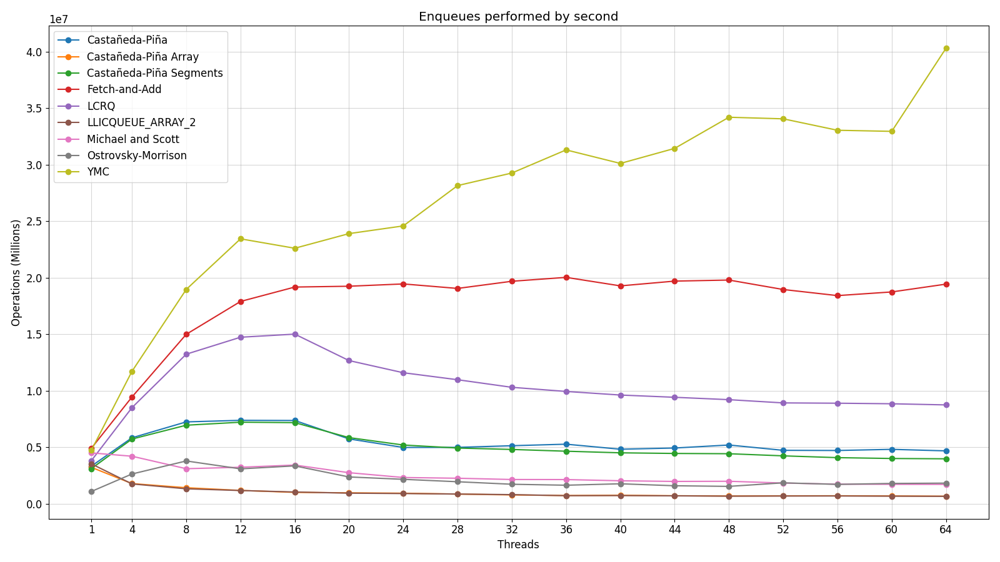

In [87]:
ax = operations.plot(marker='o', title='Enqueues performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 64 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax

##### Only Dequeue experiments

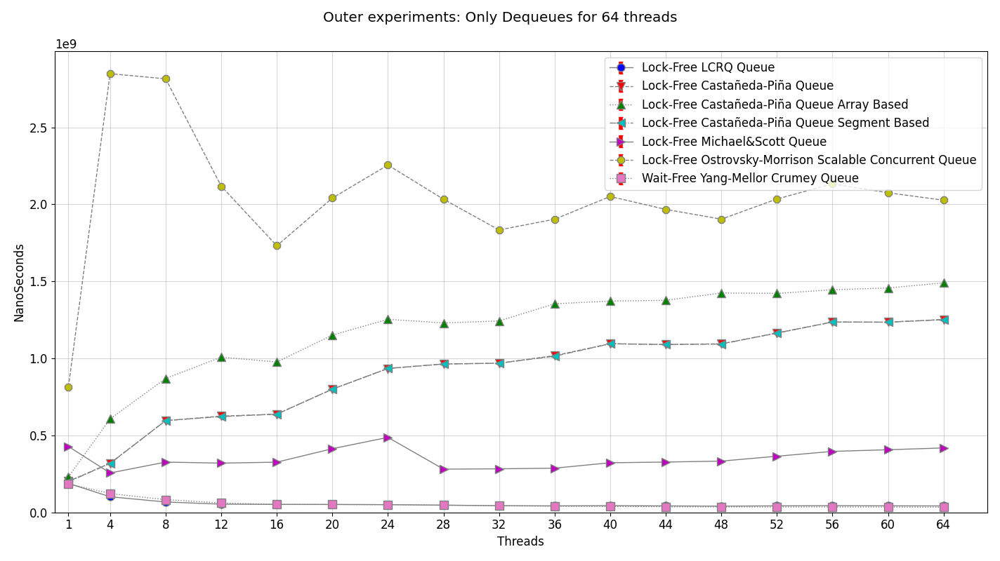

In [27]:
%matplotlib widget

json_input = '../../phd/basket-project/statistics_basket/data/queue/only_deq/64/analysis.json'
pdf_output = './figs/queue/64_only_deq.pdf'
fig_title  = 'Outer experiments: Only Dequeues for 64 threads'

generate_figure(json_input, fig_title, 64)
generate_figure(json_input, fig_title, 64, generate_pdf=True, pdf_output=pdf_output)

In [76]:
json_input = 'data/queue/only_deq/64/analysis.json'
latex_output = 'data/queue/only_deq/64/only_deq.tex'
label = 'only_deq_64'
caption = 'Mean times for "Only-Dequeue" experiments for 64 threads'

result = to_latex(json_input, latex_output, label, caption)
result = result.T
cols = result.columns.to_list()
cols.sort()
result = result[cols]

result.style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"201,967,052.30","230,704,248.73","199,148,073.83","188,614,478.07","427,956,875.37","815,014,894.37","185,539,993.10"
4,"319,327,992.93","607,341,707.37","317,869,025.63","101,529,102.73","256,046,778.23","2,848,333,938.03","122,429,671.03"
8,"595,787,611.67","869,589,943.43","596,393,054.93","67,873,456.40","326,738,128.53","2,815,012,532.00","82,849,271.60"
12,"625,184,509.37","1,008,104,732.57","622,061,084.87","53,526,911.63","320,049,484.67","2,117,765,209.43","61,782,510.60"
16,"638,090,253.63","976,373,062.73","637,948,710.43","52,126,197.57","326,268,635.33","1,731,241,582.50","51,763,298.70"
20,"800,092,826.93","1,151,202,749.77","799,938,343.93","51,754,303.70","413,649,155.43","2,040,996,705.93","51,343,200.40"
24,"933,944,962.10","1,253,784,045.17","935,356,110.27","50,393,564.03","487,170,736.03","2,255,171,277.57","50,153,088.70"
28,"963,570,023.73","1,230,134,770.67","963,600,820.10","47,183,630.03","280,965,963.90","2,033,297,482.13","46,985,080.03"
32,"968,881,260.13","1,242,863,526.50","968,253,620.33","43,837,591.13","283,027,375.63","1,833,870,854.20","43,234,450.17"
36,"1,018,059,273.97","1,354,701,393.20","1,014,409,530.50","42,506,575.43","287,362,059.63","1,903,569,360.53","39,907,488.97"


In [79]:
description = result.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)
description

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,"896,043,854.39","1,171,362,877.30","895,286,047.87","58,707,502.56","351,664,992.95","2,034,480,640.91","57,975,223.99"
std,"318,792,747.15","342,416,802.25","319,261,832.82","36,576,573.79","63,633,423.22","432,793,518.44","39,820,319.32"
min,"201,967,052.30","230,704,248.73","199,148,073.83","40,819,960.37","256,046,778.23","815,014,894.37","33,910,014.60"
25%,"638,090,253.63","1,008,104,732.57","637,948,710.43","42,654,425.37","320,049,484.67","1,903,848,199.53","35,374,895.83"
50%,"968,881,260.13","1,253,784,045.17","968,253,620.33","44,053,640.20","326,958,605.30","2,034,620,096.83","43,234,450.17"
75%,"1,095,414,559.07","1,422,026,373.93","1,094,739,116.73","52,126,197.57","406,860,620.70","2,117,765,209.43","51,763,298.70"
max,"1,252,521,430.63","1,490,135,524.67","1,251,119,618.57","188,614,478.07","487,170,736.03","2,848,333,938.03","185,539,993.10"


In [81]:
ymc = result['YMC']
percent = lambda x: ((ymc - x) / ymc) * 100
percentages = result.apply(percent)
percentages.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,-8.85,-24.34,-7.33,-1.66,-130.65,-339.27,0.00
4,-160.83,-396.07,-159.63,17.07,-109.14,"-2,226.51",0.00
8,-619.12,-949.60,-619.85,18.08,-294.38,"-3,297.75",0.00
12,-911.91,"-1,531.70",-906.86,13.36,-418.03,"-3,327.77",0.00
16,"-1,132.71","-1,786.23","-1,132.43",-0.70,-530.31,"-3,244.53",0.00
20,"-1,458.32","-2,142.17","-1,458.02",-0.80,-705.66,"-3,875.20",0.00
24,"-1,762.19","-2,399.91","-1,765.00",-0.48,-871.37,"-4,396.58",0.00
28,"-1,950.80","-2,518.14","-1,950.87",-0.42,-497.99,"-4,227.54",0.00
32,"-2,140.99","-2,774.71","-2,139.54",-1.40,-554.63,"-4,141.69",0.00
36,"-2,451.05","-3,294.60","-2,441.90",-6.51,-620.07,"-4,669.96",0.00


In [82]:
operations = result.apply(lambda x: 1000000 / (x / 1000000000), axis=1)
operations.style\
    .format(precision=2, thousands=',', decimal='.')\
    .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
1,"4,951,302.64","4,334,553.90","5,021,389.26","5,301,819.94","2,336,684.04","1,226,971.44","5,389,673.59"
4,"3,131,576.38","1,646,519.56","3,145,949.81","9,849,392.67","3,905,536.35","351,082.43","8,167,954.64"
8,"1,678,450.48","1,149,967.30","1,676,746.55","14,733,300.07","3,060,554.96","355,238.21","12,070,112.15"
12,"1,599,527.80","991,960.43","1,607,559.17","18,682,191.25","3,124,516.83","472,195.88","16,185,810.36"
16,"1,567,176.42","1,024,198.68","1,567,524.13","19,184,211.52","3,064,959.03","577,620.14","19,318,706.98"
20,"1,249,854.97","868,656.72","1,250,096.35","19,322,064.61","2,417,507.66","489,956.69","19,476,775.74"
24,"1,070,726.91","797,585.52","1,069,111.53","19,843,803.85","2,052,668.45","443,425.30","19,938,951.44"
28,"1,037,807.30","812,919.06","1,037,774.13","21,193,791.14","3,559,149.96","491,811.95","21,283,352.06"
32,"1,032,118.22","804,593.57","1,032,787.26","22,811,472.39","3,533,227.12","545,294.67","23,129,703.19"
36,"982,261.08","738,170.05","985,795.15","23,525,771.95","3,479,930.51","525,328.90","25,057,953.43"


In [83]:
operations.describe().style \
  .format(precision=2, thousands=",", decimal=".") \
  .format_index(str.upper, axis=1)

,CASTAÑEDA-PIÑA,CASTAÑEDA-PIÑA ARRAY,CASTAÑEDA-PIÑA SEGMENTS,LCRQ,MICHAEL AND SCOTT,OSTROVSKY-MORRISON,YMC
count,17.00,17.00,17.00,17.00,17.00,17.00,17.00
mean,"1,430,631.27","1,063,443.96","1,436,294.44","19,917,472.27","2,929,886.69","525,624.01","21,568,040.33"
std,"1,071,522.86","877,456.58","1,087,269.99","5,343,784.04","514,742.16","189,669.96","7,473,816.92"
min,"798,389.53","671,079.90","799,284.09","5,301,819.94","2,052,668.45","351,082.43","5,389,673.59"
25%,"912,896.39","703,221.84","913,459.64","19,184,211.52","2,457,844.16","472,195.88","19,318,706.98"
50%,"1,032,118.22","797,585.52","1,032,787.26","22,699,599.75","3,058,491.15","491,492.25","23,129,703.19"
75%,"1,567,176.42","991,960.43","1,567,524.13","23,444,226.28","3,124,516.83","525,251.96","28,268,634.48"
max,"4,951,302.64","4,334,553.90","5,021,389.26","24,497,818.98","3,905,536.35","1,226,971.44","29,489,813.31"


<Axes: title={'center': 'Dequeues performed by second'}, xlabel='Threads', ylabel='Operations (Millions)'>

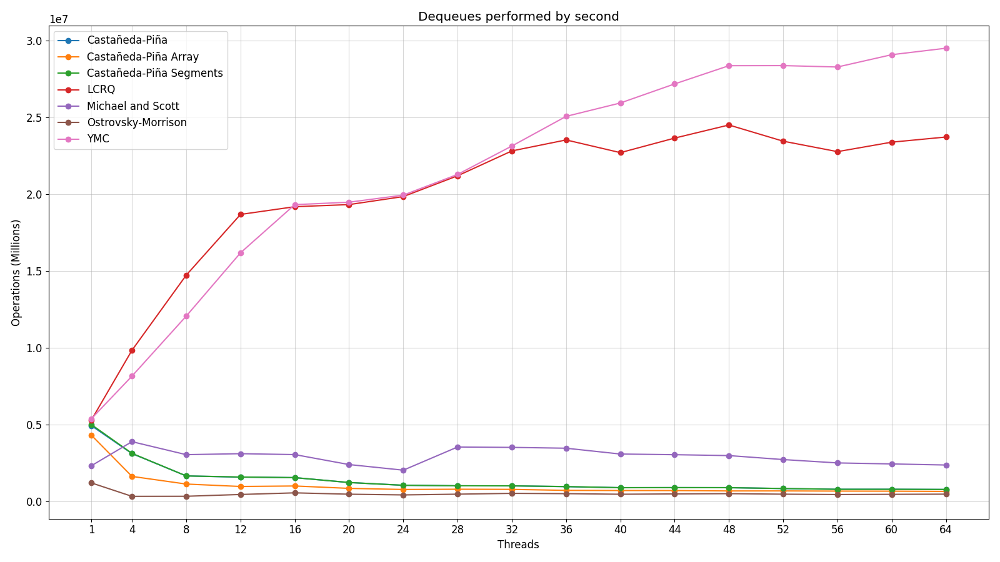

In [84]:
ax = operations.plot(marker='o', title='Dequeues performed by second', figsize=(16, 9))
major_ticks = np.arange(0, 64 + 1, 4)
major_ticks = np.delete(major_ticks, 0)
major_ticks = np.insert(major_ticks, 0, 1)
ax.set_ylabel('Operations (Millions)')
ax.set_xlabel('Threads')
ax.set_xticks(major_ticks)
ax.grid(visible=True, axis='both', alpha=0.5)
ax